# DonorsChoose

<p>
DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.
</p>
<p>
    Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:
<ul>
<li>
    How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible</li>
    <li>How to increase the consistency of project vetting across different volunteers to improve the experience for teachers</li>
    <li>How to focus volunteer time on the applications that need the most assistance</li>
    </ul>
</p>    
<p>
The goal of the competition is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.
</p>

## About the DonorsChoose Data Set

The `train.csv` data set provided by DonorsChoose contains the following features:

Feature | Description 
----------|---------------
**`project_id`** | A unique identifier for the proposed project. **Example:** `p036502`   
**`project_title`**    | Title of the project. **Examples:**<br><ul><li><code>Art Will Make You Happy!</code></li><li><code>First Grade Fun</code></li></ul> 
**`project_grade_category`** | Grade level of students for which the project is targeted. One of the following enumerated values: <br/><ul><li><code>Grades PreK-2</code></li><li><code>Grades 3-5</code></li><li><code>Grades 6-8</code></li><li><code>Grades 9-12</code></li></ul>  
 **`project_subject_categories`** | One or more (comma-separated) subject categories for the project from the following enumerated list of values:  <br/><ul><li><code>Applied Learning</code></li><li><code>Care &amp; Hunger</code></li><li><code>Health &amp; Sports</code></li><li><code>History &amp; Civics</code></li><li><code>Literacy &amp; Language</code></li><li><code>Math &amp; Science</code></li><li><code>Music &amp; The Arts</code></li><li><code>Special Needs</code></li><li><code>Warmth</code></li></ul><br/> **Examples:** <br/><ul><li><code>Music &amp; The Arts</code></li><li><code>Literacy &amp; Language, Math &amp; Science</code></li>  
  **`school_state`** | State where school is located ([Two-letter U.S. postal code](https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations#Postal_codes)). **Example:** `WY`
**`project_subject_subcategories`** | One or more (comma-separated) subject subcategories for the project. **Examples:** <br/><ul><li><code>Literacy</code></li><li><code>Literature &amp; Writing, Social Sciences</code></li></ul> 
**`project_resource_summary`** | An explanation of the resources needed for the project. **Example:** <br/><ul><li><code>My students need hands on literacy materials to manage sensory needs!</code</li></ul> 
**`project_essay_1`**    | First application essay<sup>*</sup>  
**`project_essay_2`**    | Second application essay<sup>*</sup> 
**`project_essay_3`**    | Third application essay<sup>*</sup> 
**`project_essay_4`**    | Fourth application essay<sup>*</sup> 
**`project_submitted_datetime`** | Datetime when project application was submitted. **Example:** `2016-04-28 12:43:56.245`   
**`teacher_id`** | A unique identifier for the teacher of the proposed project. **Example:** `bdf8baa8fedef6bfeec7ae4ff1c15c56`  
**`teacher_prefix`** | Teacher's title. One of the following enumerated values: <br/><ul><li><code>nan</code></li><li><code>Dr.</code></li><li><code>Mr.</code></li><li><code>Mrs.</code></li><li><code>Ms.</code></li><li><code>Teacher.</code></li></ul>  
**`teacher_number_of_previously_posted_projects`** | Number of project applications previously submitted by the same teacher. **Example:** `2` 

<sup>*</sup> See the section <b>Notes on the Essay Data</b> for more details about these features.

Additionally, the `resources.csv` data set provides more data about the resources required for each project. Each line in this file represents a resource required by a project:

Feature | Description 
----------|---------------
**`id`** | A `project_id` value from the `train.csv` file.  **Example:** `p036502`   
**`description`** | Desciption of the resource. **Example:** `Tenor Saxophone Reeds, Box of 25`   
**`quantity`** | Quantity of the resource required. **Example:** `3`   
**`price`** | Price of the resource required. **Example:** `9.95`   

**Note:** Many projects require multiple resources. The `id` value corresponds to a `project_id` in train.csv, so you use it as a key to retrieve all resources needed for a project:

The data set contains the following label (the value you will attempt to predict):

Label | Description
----------|---------------
`project_is_approved` | A binary flag indicating whether DonorsChoose approved the project. A value of `0` indicates the project was not approved, and a value of `1` indicates the project was approved.

### Notes on the Essay Data

<ul>
Prior to May 17, 2016, the prompts for the essays were as follows:
<li>__project_essay_1:__ "Introduce us to your classroom"</li>
<li>__project_essay_2:__ "Tell us more about your students"</li>
<li>__project_essay_3:__ "Describe how your students will use the materials you're requesting"</li>
<li>__project_essay_3:__ "Close by sharing why your project will make a difference"</li>
</ul>


<ul>
Starting on May 17, 2016, the number of essays was reduced from 4 to 2, and the prompts for the first 2 essays were changed to the following:<br>
<li>__project_essay_1:__ "Describe your students: What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful."</li>
<li>__project_essay_2:__ "About your project: How will these materials make a difference in your students' learning and improve their school lives?"</li>
<br>For all projects with project_submitted_datetime of 2016-05-17 and later, the values of project_essay_3 and project_essay_4 will be NaN.
</ul>


In [ ]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

D:\installed\Anaconda3\lib\site-packages\gensim\utils.py:1197: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


## Reading Data

In [ ]:
project_data = pd.read_csv('train_data.csv')
resource_data = pd.read_csv('resources.csv')

In [ ]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (109248, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [ ]:
print("Number of data points in train data", resource_data.shape)
print(resource_data.columns.values)
resource_data.head(2)

Number of data points in train data (1541272, 4)
['id' 'description' 'quantity' 'price']


,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95


# Exploratory Data Analysis

Number of projects thar are approved for funding  92706 , ( 84.85830404217927 %)
Number of projects thar are not approved for funding  16542 , ( 15.141695957820739 %)


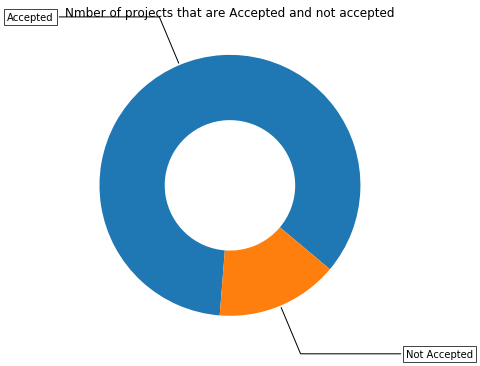

In [ ]:
# this code is taken from 
# https://matplotlib.org/gallery/pie_and_polar_charts/pie_and_donut_labels.html#sphx-glr-gallery-pie-and-polar-charts-pie-and-donut-labels-py


y_value_counts = project_data['project_is_approved'].value_counts()
print("Number of projects thar are approved for funding ", y_value_counts[1], ", (", (y_value_counts[1]/(y_value_counts[1]+y_value_counts[0]))*100,"%)")
print("Number of projects thar are not approved for funding ", y_value_counts[0], ", (", (y_value_counts[0]/(y_value_counts[1]+y_value_counts[0]))*100,"%)")

fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(aspect="equal"))
recipe = ["Accepted", "Not Accepted"]

data = [y_value_counts[1], y_value_counts[0]]

wedges, texts = ax.pie(data, wedgeprops=dict(width=0.5), startangle=-40)

bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
kw = dict(xycoords='data', textcoords='data', arrowprops=dict(arrowstyle="-"),
          bbox=bbox_props, zorder=0, va="center")

for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1)/2. + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    connectionstyle = "angle,angleA=0,angleB={}".format(ang)
    kw["arrowprops"].update({"connectionstyle": connectionstyle})
    ax.annotate(recipe[i], xy=(x, y), xytext=(1.35*np.sign(x), 1.4*y),
                 horizontalalignment=horizontalalignment, **kw)

ax.set_title("Nmber of projects that are Accepted and not accepted")

plt.show()

###  Univariate Analysis: Text features (Project Essay's)

In [ ]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

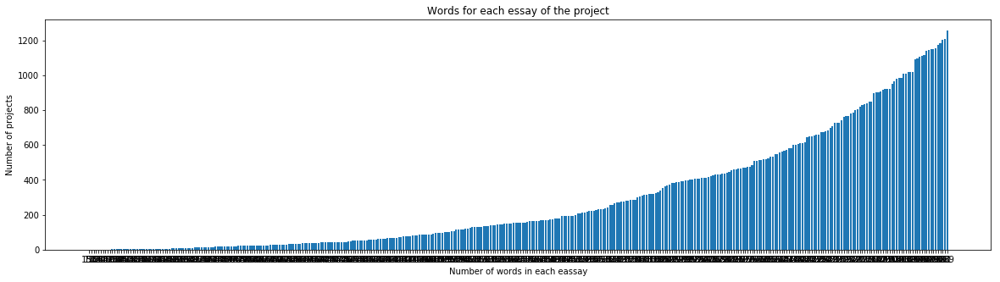

In [ ]:
#How to calculate number of words in a string in DataFrame: https://stackoverflow.com/a/37483537/4084039
word_count = project_data['essay'].str.split().apply(len).value_counts()
word_dict = dict(word_count)
word_dict = dict(sorted(word_dict.items(), key=lambda kv: kv[1]))


ind = np.arange(len(word_dict))
plt.figure(figsize=(20,5))
p1 = plt.bar(ind, list(word_dict.values()))

plt.ylabel('Number of projects')
plt.xlabel('Number of words in each eassay')
plt.title('Words for each essay of the project')
plt.xticks(ind, list(word_dict.keys()))
plt.show()

D:\installed\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6571: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.



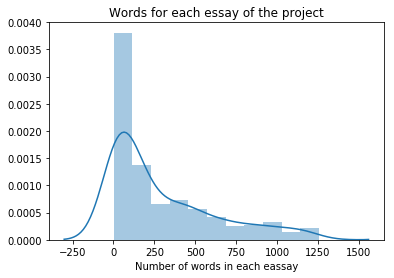

In [ ]:
sns.distplot(word_count.values)
plt.title('Words for each essay of the project')
plt.xlabel('Number of words in each eassay')
plt.show()


In [ ]:
approved_word_count = project_data[project_data['project_is_approved']==1]['essay'].str.split().apply(len)
approved_word_count = approved_word_count.values

rejected_word_count = project_data[project_data['project_is_approved']==0]['essay'].str.split().apply(len)
rejected_word_count = rejected_word_count.values

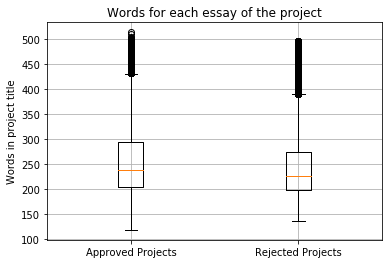

In [ ]:
# https://glowingpython.blogspot.com/2012/09/boxplot-with-matplotlib.html
plt.boxplot([approved_word_count, rejected_word_count])
plt.title('Words for each essay of the project')
plt.xticks([1,2],('Approved Projects','Rejected Projects'))
plt.ylabel('Words in project title')
plt.grid()
plt.show()

##  Loading Data that is already preprocessed

In [ ]:
import pandas
data = pandas.read_csv('preprocessed_data.csv',nrows=50000)
data.head()


,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price
0,ca,mrs,grades_prek_2,53,1,math_science,appliedsciences health_lifescience,i fortunate enough use fairy tale stem kits cl...,725.05
1,ut,ms,grades_3_5,4,1,specialneeds,specialneeds,imagine 8 9 years old you third grade classroo...,213.03
2,ca,mrs,grades_prek_2,10,1,literacy_language,literacy,having class 24 students comes diverse learner...,329.00
3,ga,mrs,grades_prek_2,2,1,appliedlearning,earlydevelopment,i recently read article giving students choice...,481.04
4,wa,mrs,grades_3_5,2,1,literacy_language,literacy,my students crave challenge eat obstacles brea...,17.74


In [ ]:
y = data['project_is_approved'].values
X = data.drop(['project_is_approved'], axis=1)

<h2>1.2 Splitting data into Train and cross validation(or test): Stratified Sampling</h2>

In [ ]:
# please write all the code with proper documentation, and proper titles for each subsection
# go through documentations and blogs before you start coding
# first figure out what to do, and then think about how to do.
# reading and understanding error messages will be very much helpfull in debugging your code
# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label

# train test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, stratify=y)
X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, test_size=0.33, stratify=y_train)

<h2>1.3 Make Data Model Ready: encoding eassay, and project_title</h2>

In [ ]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [ ]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [ ]:
# Combining all the above stundents 
from tqdm import tqdm
def preprocess_text(text_data):
    preprocessed_text = []
    # tqdm is for printing the status bar
    for sentance in tqdm(text_data):
        sent = decontracted(sentance)
        sent = sent.replace('\\r', ' ')
        sent = sent.replace('\\n', ' ')
        sent = sent.replace('\\"', ' ')
        sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
        # https://gist.github.com/sebleier/554280
        sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
        preprocessed_text.append(sent.lower().strip())
    return preprocessed_text

In [ ]:
preprocessed_X_train = preprocess_text(X_train['essay'].values)
preprocessed_X_cv = preprocess_text(X_cv['essay'].values)
preprocessed_X_test = preprocess_text(X_test['essay'].values)

100%|██████████| 16500/16500 [00:08<00:00, 1879.66it/s]


# Tfidf method for Preprocessed essay 

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=10,ngram_range=(1,4), max_features=5000)
text_tfidf = vectorizer.fit(preprocessed_X_train)

X_train_essay_tfidf = vectorizer.transform(preprocessed_X_train)
X_cv_essay_tfidf = vectorizer.transform(preprocessed_X_cv)
X_test_essay_tfidf = vectorizer.transform(preprocessed_X_test)

print("After vectorizations")
print(X_train_essay_tfidf.shape, y_train.shape)
print(X_cv_essay_tfidf.shape, y_cv.shape)
print(X_test_essay_tfidf.shape, y_test.shape)

# print("Shape of matrix after one hot encodig ",text_tfidf.shape)

After vectorizations
(22445, 5000) (22445,)
(11055, 5000) (11055,)
(16500, 5000) (16500,)


<h2>1.4 Make Data Model Ready: encoding numerical, categorical features</h2>

# a. Categorical features

**School State**

In [ ]:
# please write all the code with proper documentation, and proper titles for each subsection
# go through documentations and blogs before you start coding 
# first figure out what to do, and then think about how to do.
# reading and understanding error messages will be very much helpfull in debugging your code
# make sure you featurize train and test data separatly

# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label


# school_state
vectorizer = CountVectorizer()
vectorizer.fit(X_train['school_state'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_state_ohe = vectorizer.transform(X_train['school_state'].values)
X_cv_state_ohe = vectorizer.transform(X_cv['school_state'].values)
X_test_state_ohe = vectorizer.transform(X_test['school_state'].values)

print("After vectorizations")
print(X_train_state_ohe.shape, y_train.shape)
print(X_cv_state_ohe.shape, y_cv.shape)
print(X_test_state_ohe.shape, y_test.shape)
print(vectorizer.get_feature_names())
l.extend(vectorizer.get_feature_names())
print("="*100)

After vectorizations
(22445, 51) (22445,)
(11055, 51) (11055,)
(16500, 51) (16500,)
['ak', 'al', 'ar', 'az', 'ca', 'co', 'ct', 'dc', 'de', 'fl', 'ga', 'hi', 'ia', 'id', 'il', 'in', 'ks', 'ky', 'la', 'ma', 'md', 'me', 'mi', 'mn', 'mo', 'ms', 'mt', 'nc', 'nd', 'ne', 'nh', 'nj', 'nm', 'nv', 'ny', 'oh', 'ok', 'or', 'pa', 'ri', 'sc', 'sd', 'tn', 'tx', 'ut', 'va', 'vt', 'wa', 'wi', 'wv', 'wy']


**Teacher Prefix**

> Indented block



In [ ]:
#teacher_prefix
vectorizer = CountVectorizer()
vectorizer.fit(X_train['teacher_prefix'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_teacher_ohe = vectorizer.transform(X_train['teacher_prefix'].values)
X_cv_teacher_ohe = vectorizer.transform(X_cv['teacher_prefix'].values)
X_test_teacher_ohe = vectorizer.transform(X_test['teacher_prefix'].values)

print("After vectorizations")
print(X_train_teacher_ohe.shape, y_train.shape)
print(X_cv_teacher_ohe.shape, y_cv.shape)
print(X_test_teacher_ohe.shape, y_test.shape)
print(vectorizer.get_feature_names())
l.extend(vectorizer.get_feature_names())
print("="*100)

After vectorizations
(22445, 5) (22445,)
(11055, 5) (11055,)
(16500, 5) (16500,)
['dr', 'mr', 'mrs', 'ms', 'teacher']


**Project Grade Category**

In [ ]:
# project_grade_category
vectorizer = CountVectorizer()
vectorizer.fit(X_train['project_grade_category'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_grade_ohe = vectorizer.transform(X_train['project_grade_category'].values)
X_cv_grade_ohe = vectorizer.transform(X_cv['project_grade_category'].values)
X_test_grade_ohe = vectorizer.transform(X_test['project_grade_category'].values)

print("After vectorizations")
print(X_train_grade_ohe.shape, y_train.shape)
print(X_cv_grade_ohe.shape, y_cv.shape)
print(X_test_grade_ohe.shape, y_test.shape)
print(vectorizer.get_feature_names())
l.extend(vectorizer.get_feature_names())
print("="*100)

After vectorizations
(22445, 4) (22445,)
(11055, 4) (11055,)
(16500, 4) (16500,)
['grades_3_5', 'grades_6_8', 'grades_9_12', 'grades_prek_2']


**Clean Categories**

In [ ]:
# clean_categories
vectorizer = CountVectorizer()
vectorizer.fit(X_train['clean_categories'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_cleancat_ohe = vectorizer.transform(X_train['clean_categories'].values)
X_cv_cleancat_ohe = vectorizer.transform(X_cv['clean_categories'].values)
X_test_cleancat_ohe = vectorizer.transform(X_test['clean_categories'].values)

print("After vectorizations")
print(X_train_cleancat_ohe.shape, y_train.shape)
print(X_cv_cleancat_ohe.shape, y_cv.shape)
print(X_test_cleancat_ohe.shape, y_test.shape)
print(vectorizer.get_feature_names())
l.extend(vectorizer.get_feature_names())
print("="*100)

After vectorizations
(22445, 9) (22445,)
(11055, 9) (11055,)
(16500, 9) (16500,)
['appliedlearning', 'care_hunger', 'health_sports', 'history_civics', 'literacy_language', 'math_science', 'music_arts', 'specialneeds', 'warmth']


**Clean Subcategories**

In [ ]:
# clean_subcategories
vectorizer = CountVectorizer()
vectorizer.fit(X_train['clean_subcategories'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_cl_subcat_ohe = vectorizer.transform(X_train['clean_subcategories'].values)
X_cv_cl_subcat_ohe = vectorizer.transform(X_cv['clean_subcategories'].values)
X_test_cl_subcat_ohe = vectorizer.transform(X_test['clean_subcategories'].values)

print("After vectorizations")
print(X_train_cl_subcat_ohe.shape, y_train.shape)
print(X_cv_cl_subcat_ohe.shape, y_cv.shape)
print(X_test_cl_subcat_ohe.shape, y_test.shape)
print(vectorizer.get_feature_names())
l.extend(vectorizer.get_feature_names())
print("="*100)

After vectorizations
(22445, 30) (22445,)
(11055, 30) (11055,)
(16500, 30) (16500,)
['appliedsciences', 'care_hunger', 'charactereducation', 'civics_government', 'college_careerprep', 'communityservice', 'earlydevelopment', 'economics', 'environmentalscience', 'esl', 'extracurricular', 'financialliteracy', 'foreignlanguages', 'gym_fitness', 'health_lifescience', 'health_wellness', 'history_geography', 'literacy', 'literature_writing', 'mathematics', 'music', 'nutritioneducation', 'other', 'parentinvolvement', 'performingarts', 'socialsciences', 'specialneeds', 'teamsports', 'visualarts', 'warmth']


# b. Numerical features

**Price**

In [ ]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.
normalizer.fit(X_train['price'].values.reshape(-1,1))

X_train_price_norm = normalizer.transform(X_train['price'].values.reshape(-1,1))
X_cv_price_norm = normalizer.transform(X_cv['price'].values.reshape(-1,1))
X_test_price_norm = normalizer.transform(X_test['price'].values.reshape(-1,1))



print("After vectorizations")
print(X_train_price_norm.shape, y_train.shape)
print(X_cv_price_norm.shape, y_cv.shape)
print(X_test_price_norm.shape, y_test.shape)
l.append('Price')
print("="*100)

After vectorizations
(22445, 1) (22445,)
(11055, 1) (11055,)
(16500, 1) (16500,)


**Teacher number of previously posted projects**

In [ ]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.
normalizer.fit(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

X_train_teacher_norm = normalizer.transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
X_cv_teacher_norm = normalizer.transform(X_cv['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
X_test_teacher_norm = normalizer.transform(X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))



print("After vectorizations")
print(X_train_teacher_norm.shape, y_train.shape)
print(X_cv_teacher_norm.shape, y_cv.shape)
print(X_test_teacher_norm.shape, y_test.shape)
l.append('teacher_number_of_previously_posted_projects')
print("="*100)

After vectorizations
(22445, 1) (22445,)
(11055, 1) (11055,)
(16500, 1) (16500,)


# 1. Concatinating features

In [ ]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X_tr2 = hstack((X_train_essay_tfidf, X_train_state_ohe, X_train_teacher_ohe, X_train_grade_ohe,X_train_cleancat_ohe,X_train_cl_subcat_ohe, X_train_price_norm,X_train_teacher_norm)).tocsr()
X_cr2 = hstack((X_cv_essay_tfidf, X_cv_state_ohe, X_cv_teacher_ohe, X_cv_grade_ohe,X_cv_cleancat_ohe,X_cv_cl_subcat_ohe, X_cv_price_norm,X_cv_teacher_norm)).tocsr()
X_te2 = hstack((X_test_essay_tfidf, X_test_state_ohe, X_test_teacher_ohe, X_test_grade_ohe,X_test_cleancat_ohe,X_test_cl_subcat_ohe, X_test_price_norm,X_test_teacher_norm)).tocsr()

print("Final Data matrix")
print(X_tr2.shape, y_train.shape)
print(X_cr2.shape, y_cv.shape)
print(X_te2.shape, y_test.shape)
print("="*100)

Final Data matrix
(22445, 5101) (22445,)
(11055, 5101) (11055,)
(16500, 5101) (16500,)


# 1. Naive Bayes

<h2>1.5 Appling NB on different kind of featurization as mentioned in the instructions</h2>

<br>Apply NB on different kind of featurization as mentioned in the instructions
<br> For Every model that you work on make sure you do the step 2 and step 3 of instrucations

In [ ]:
def batch_predict(clf, data):
    # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
    # not the predicted outputs

    y_data_pred = []
    tr_loop = data.shape[0] - data.shape[0]%1000
    # consider you X_tr shape is 49041, then your tr_loop will be 49041 - 49041%1000 = 49000
    # in this for loop we will iterate unti the last 1000 multiplier
    for i in range(0, tr_loop, 1000):
        y_data_pred.extend(clf.predict_proba(data[i:i+1000])[:,1])
    # we will be predicting for the last data points
    if data.shape[0]%1000 !=0:
        y_data_pred.extend(clf.predict_proba(data[tr_loop:])[:,1])
    
    return y_data_pred

In [ ]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def find_best_threshold(threshould, fpr, tpr):
    t = threshould[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_t(proba, threshould):
    predictions = []
    for i in proba:
        if i>=threshould:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

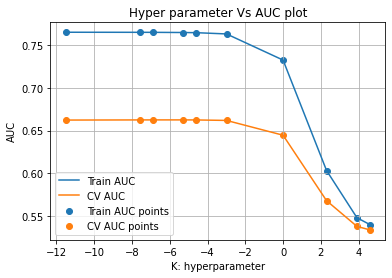

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
8,0.025357,0.000458,0.009516,0.000108,1e-05,{'alpha': 1e-05},0.653323,0.669809,0.663600,0.662244,0.006798,5,0.761666,0.769067,0.764021,0.764918,0.003087
1,0.025115,0.000248,0.009733,0.000225,0.0005,{'alpha': 0.0005},0.653315,0.670022,0.663897,0.662411,0.006901,3,0.761648,0.768995,0.763874,0.764839,0.003076
3,0.024886,0.000042,0.009489,0.000051,0.001,{'alpha': 0.001},0.653303,0.670072,0.663927,0.662434,0.006927,2,0.761632,0.768958,0.763821,0.764804,0.003071
2,0.024991,0.000104,0.009514,0.000091,0.005,{'alpha': 0.005},0.653211,0.670173,0.663924,0.662436,0.007004,1,0.761501,0.768753,0.763574,0.764609,0.003050
7,0.024800,0.000125,0.009629,0.000180,0.01,{'alpha': 0.01},0.653131,0.670196,0.663831,0.662386,0.007041,4,0.761338,0.768538,0.763343,0.764406,0.003034


In [ ]:
# please write all the code with proper documentation, and proper titles for each subsection
# go through documentations and blogs before you start coding
# first figure out what to do, and then think about how to do.
# reading and understanding error messages will be very much helpfull in debugging your code
# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label
from sklearn.model_selection import GridSearchCV
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import RandomizedSearchCV
import math
nbayes2=MultinomialNB(class_prior = [0.5, 0.5])
parameter={'alpha':[0.00001,0.0005, 0.0001,0.005,0.001,0.05,0.01,0.1,0.5,1,5,10,50,100]}
model2=RandomizedSearchCV(nbayes2,parameter,cv=3,scoring='roc_auc',return_train_score=True)

model2.fit(X_tr2, y_train)

results = pd.DataFrame.from_dict(model2.cv_results_)
# results
results = results.sort_values(['param_alpha'])

train_auc= results['mean_train_score']
train_auc_std= results['std_train_score']
cv_auc = results['mean_test_score']
cv_auc_std= results['std_test_score']
K =  results['param_alpha']
# print(type(K))

log_val=[]
for i in K:
  log_val.append(math.log(i))
plt.plot(log_val, train_auc, label='Train AUC')
# this code is copied from here: https://stackoverflow.com/a/48803361/4084039
# plt.gca().fill_between(K, train_auc - train_auc_std,train_auc + train_auc_std,alpha=0.2,color='darkblue')

plt.plot(log_val, cv_auc, label='CV AUC')
# this code is copied from here: https://stackoverflow.com/a/48803361/4084039
# plt.gca().fill_between(K, cv_auc - cv_auc_std,cv_auc + cv_auc_std,alpha=0.2,color='darkorange')

plt.scatter(log_val, train_auc, label='Train AUC points')
plt.scatter(log_val, cv_auc, label='CV AUC points')


plt.legend()
plt.xlabel("K: hyperparameter")
plt.ylabel("AUC")
plt.title("Hyper parameter Vs AUC plot")
plt.grid()
plt.show()

results.head()


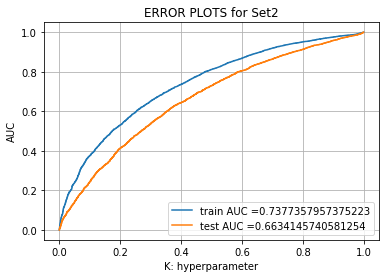

In [ ]:
best_par=0.001
nbayes3=MultinomialNB(alpha=best_par,class_prior = [0.5, 0.5],fit_prior = False)
nbayes3.fit(X_tr2, y_train)

y_train_pred2 = batch_predict(nbayes3, X_tr2)    
y_test_pred2 = batch_predict(nbayes3, X_te2)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred2)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred2)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("K: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS for Set2")
plt.grid()
plt.show()


In [ ]:
TFIDF_AUC_score=round(np.trapz(test_tpr, test_fpr),2)
TFIDF_AUC_score

0.66

the maximum value of tpr*(1-fpr) 0.45720405957286675 for threshold 0.515


[Text(0, 0.5, 'Actual No'), Text(0, 1.5, 'Actual Yes')]

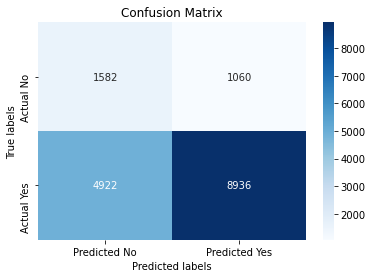

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt     
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
cm = confusion_matrix(y_test, predict_with_best_t(y_test_pred2, best_t))

ax= plt.subplot()
sns.heatmap(cm, annot=True,cmap='Blues',fmt="d",ax=ax)
# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels') 
ax.set_ylim(2.0, 0)
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(['Predicted No','Predicted Yes']) 
ax.yaxis.set_ticklabels(['Actual No','Actual Yes'])

# Applying Decision Tree Classifier on TF-IDF W2V essay Feature

## TFIDF W2V method for preprocessed essay

In [ ]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer()
tfidf_model.fit(preprocessed_X_train)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [ ]:
# average Word2Vec
# compute average word2vec for each review.
def tfidf_w2v(tw_data):
  tfidf_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
  for sentence in tqdm(tw_data): # for each review/sentence
      vector = np.zeros(300) # as word vectors are of zero length
      tf_idf_weight =0; # num of words with a valid vector in the sentence/review
      for word in sentence.split(): # for each word in a review/sentence
          if (word in glove_words) and (word in tfidf_words):
              vec = model[word] # getting the vector for each word
              # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
              tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
              vector += (vec * tf_idf) # calculating tfidf weighted w2v
              tf_idf_weight += tf_idf
      if tf_idf_weight != 0:
          vector /= tf_idf_weight
      tfidf_w2v_vectors.append(vector)
  return tfidf_w2v_vectors
# print(len(tfidf_w2v_vectors))
# print(len(tfidf_w2v_vectors[0]))

In [ ]:
tfidf_w2v_X_train=tfidf_w2v(preprocessed_X_train)
tfidf_w2v_X_test=tfidf_w2v(preprocessed_X_test)
tfidf_w2v_X_cv=tfidf_w2v(preprocessed_X_cv)

100%|██████████| 11055/11055 [00:21<00:00, 519.62it/s]


## 2. Concatinating features for DT classifier

In [ ]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X_tr2 = hstack((tfidf_w2v_X_train, X_train_state_ohe, X_train_teacher_ohe, X_train_grade_ohe,X_train_cleancat_ohe,X_train_cl_subcat_ohe, X_train_price_norm,X_train_teacher_norm)).tocsr()
X_cr2 = hstack((tfidf_w2v_X_cv, X_cv_state_ohe, X_cv_teacher_ohe, X_cv_grade_ohe,X_cv_cleancat_ohe,X_cv_cl_subcat_ohe, X_cv_price_norm,X_cv_teacher_norm)).tocsr()
X_te2 = hstack((tfidf_w2v_X_test, X_test_state_ohe, X_test_teacher_ohe, X_test_grade_ohe,X_test_cleancat_ohe,X_test_cl_subcat_ohe, X_test_price_norm,X_test_teacher_norm)).tocsr()

print("Final Data matrix")
print(X_tr2.shape, y_train.shape)
print(X_cr2.shape, y_cv.shape)
print(X_te2.shape, y_test.shape)
print("="*100)

Final Data matrix
(22445, 396) (22445,)
(11055, 396) (11055,)
(16500, 396) (16500,)


**1. Train data tuning**

In [ ]:
DTC3=DecisionTreeClassifier()
parameter={'max_depth':[1, 5, 10, 50],'min_samples_split':[5, 10, 100, 500]}
model3=RandomizedSearchCV(DTC3,parameter,cv=3,scoring='roc_auc',return_train_score=True)

model3.fit(X_tr2, y_train)

results_train_set2 = pd.DataFrame.from_dict(model3.cv_results_)
results_train_set2=results_train_set2.sort_values(['param_max_depth'])


**Train data heatmap**

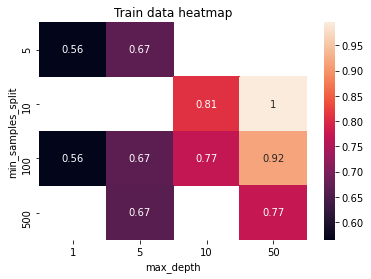

In [ ]:
X = results_train_set2['param_min_samples_split']
Y = results_train_set2['param_max_depth']
Z = results_train_set2['mean_train_score']
data = pd.DataFrame({'min_samples_split': X, 'max_depth': Y, 'AUC': Z})
data_pivoted = data.pivot(index="min_samples_split", columns="max_depth", values="AUC")
ax = sns.heatmap(data_pivoted,annot=True)
ax.set_title('Train data heatmap')
plt.show()

**2. Validation data tuning**

In [ ]:
DTC4=DecisionTreeClassifier()
parameter={'max_depth':[1, 5, 10, 50],'min_samples_split':[5, 10, 100, 500]}
model4=RandomizedSearchCV(DTC4,parameter,cv=3,scoring='roc_auc',return_train_score=True)

model4.fit(X_cr2, y_cv)

results_cv_set2 = pd.DataFrame.from_dict(model4.cv_results_)
results_cv_set2=results_cv_set2.sort_values(['param_max_depth'])

**Validation data heatmap**

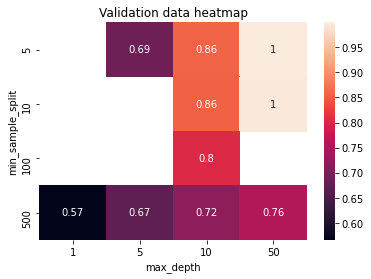

In [ ]:
P = results_cv_set2['param_min_samples_split']
Q = results_cv_set2['param_max_depth']
R = results_cv_set2['mean_train_score']
data = pd.DataFrame({'min_sample_split': P, 'max_depth': Q, 'AUC': R})
data_pivoted = data.pivot(index="min_sample_split", columns="max_depth", values="AUC")
ax = sns.heatmap(data_pivoted,annot=True)
ax.set_title('Validation data heatmap')
plt.show()

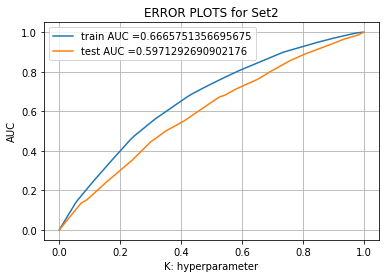

In [ ]:
best_depth=5
best_min_samples_split=100
DTC_best2=DecisionTreeClassifier(max_depth=best_depth,min_samples_split=best_min_samples_split)
DTC_best2.fit(X_tr2, y_train)

y_train_pred2 = batch_predict(DTC_best2, X_tr2)    
y_test_pred2 = batch_predict(DTC_best2, X_te2)

train_fpr2, train_tpr2, tr_thresholds2 = roc_curve(y_train, y_train_pred2)
test_fpr2, test_tpr2, te_thresholds2 = roc_curve(y_test, y_test_pred2)

plt.plot(train_fpr2, train_tpr2, label="train AUC ="+str(auc(train_fpr2, train_tpr2)))
plt.plot(test_fpr2, test_tpr2, label="test AUC ="+str(auc(test_fpr2, test_tpr2)))
plt.legend()
plt.xlabel("K: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS for Set2")
plt.grid()
plt.show()


In [ ]:
TFIDF_W2V_AUC_score=round(np.trapz(test_tpr2, test_fpr2),2)
TFIDF_W2V_AUC_score

0.6

**Confusion Matrix**

the maximum value of tpr*(1-fpr) 0.39029378410185084 for threshold 0.848


[Text(0, 0.5, 'Actual No'), Text(0, 1.5, 'Actual Yes')]

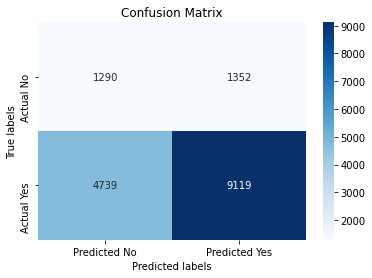

In [ ]:
best_t2 = find_best_threshold(tr_thresholds2, train_fpr2, train_tpr2)
cm2 = confusion_matrix(y_test, predict_with_best_t(y_test_pred2, best_t2))

ax2= plt.subplot()
sns.heatmap(cm2, annot=True,cmap='Blues',fmt="d",ax=ax2)
# labels, title and ticks
ax2.set_xlabel('Predicted labels')
ax2.set_ylabel('True labels') 
ax2.set_ylim(2.0, 0)
ax2.set_title('Confusion Matrix')
ax2.xaxis.set_ticklabels(['Predicted No','Predicted Yes']) 
ax2.yaxis.set_ticklabels(['Actual No','Actual Yes'])

# Applying Gradient Boosting Classifier on TF-IDF W2V essay Feature

**1. Train data tuning**

In [ ]:
# please write all the code with proper documentation, and proper titles for each subsection
# go through documentations and blogs before you start coding
# first figure out what to do, and then think about how to do.
# reading and understanding error messages will be very much helpfull in debugging your code
# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label
    # please write all the code with proper documentation, and proper titles for each subsection
# go through documentations and blogs before you start coding
# first figure out what to do, and then think about how to do.
# reading and understanding error messages will be very much helpfull in debugging your code
# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import RandomizedSearchCV
import math
GBDT1=GradientBoostingClassifier()
parameter={'max_depth':[5,10],'n_estimators':[50,100]}
model1=RandomizedSearchCV(GBDT1,parameter,cv=3,scoring='roc_auc',return_train_score=True)

model1.fit(X_tr2, y_train)

results_train_set1 = pd.DataFrame.from_dict(model1.cv_results_)
results_train_set1 = results_train_set1.sort_values(['param_max_depth'])


**Train data heatmap**

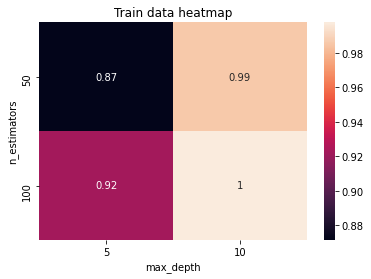

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
X = results_train_set1['param_n_estimators']
Y = results_train_set1['param_max_depth']
Z = results_train_set1['mean_train_score']
data = pd.DataFrame({'n_estimators': X, 'max_depth': Y, 'AUC': Z})
data_pivoted = data.pivot(index="n_estimators", columns="max_depth", values="AUC")
ax = sns.heatmap(data_pivoted,annot=True)
ax.set_title('Train data heatmap')
plt.show()

**2. Validation data tuning**

In [ ]:
GBDT2=GradientBoostingClassifier()
parameter={'max_depth':[5, 10],'n_estimators':[50,100]}
model2=RandomizedSearchCV(GBDT2,parameter,cv=3,scoring='roc_auc',return_train_score=True)

model2.fit(X_cr2, y_cv)

results_cv_set1 = pd.DataFrame.from_dict(model2.cv_results_)
results_cv_set1=results_cv_set1.sort_values(['param_max_depth'])

**Validation data heatmap**

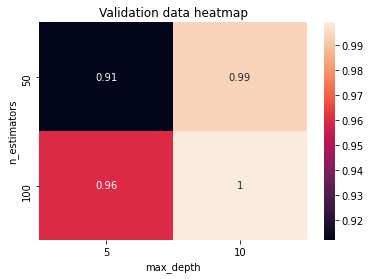

In [ ]:
P = results_cv_set1['param_n_estimators']
Q = results_cv_set1['param_max_depth']
R = results_cv_set1['mean_train_score']
data = pd.DataFrame({'n_estimators': P, 'max_depth': Q, 'AUC': R})
data_pivoted = data.pivot(index="n_estimators", columns="max_depth", values="AUC")
ax = sns.heatmap(data_pivoted,annot=True)
ax.set_title('Validation data heatmap')
plt.show()

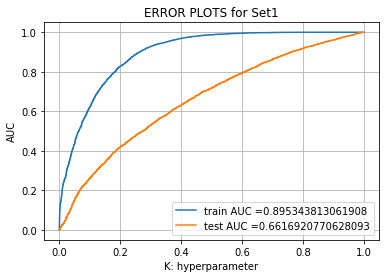

In [ ]:
best_depth=5
GBDT_best1=GradientBoostingClassifier(max_depth=best_depth,n_estimators=100)
GBDT_best1.fit(X_tr2, y_train)

y_train_pred1 = batch_predict(GBDT_best1, X_tr2)    
y_test_pred1 = batch_predict(GBDT_best1, X_te2)

train_fpr1, train_tpr1, tr_thresholds1 = roc_curve(y_train, y_train_pred1)
test_fpr1, test_tpr1, te_thresholds1 = roc_curve(y_test, y_test_pred1)

plt.plot(train_fpr1, train_tpr1, label="train AUC ="+str(auc(train_fpr1, train_tpr1)))
plt.plot(test_fpr1, test_tpr1, label="test AUC ="+str(auc(test_fpr1, test_tpr1)))
plt.legend()
plt.xlabel("K: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS for Set1")
plt.grid()
plt.show()


**AUC Score for Set-1 (TFIDF)**

In [ ]:
TFIDF_AUC_score=round(np.trapz(test_tpr1, test_fpr1),2)
TFIDF_AUC_score

0.66

**Confusion Matrix**

the maximum value of tpr*(1-fpr) 0.6669039743528258 for threshold 0.81


[Text(0, 0.5, 'Actual No'), Text(0, 1.5, 'Actual Yes')]

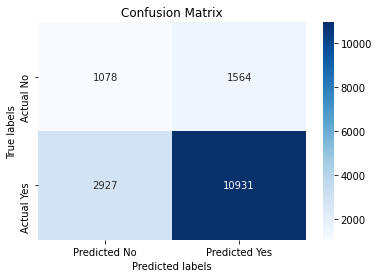

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt     
best_t1 = find_best_threshold(tr_thresholds1, train_fpr1, train_tpr1)
cm1 = confusion_matrix(y_test, predict_with_best_t(y_test_pred1, best_t1))

ax1= plt.subplot()
sns.heatmap(cm1, annot=True,cmap='Blues',fmt="d",ax=ax1)
# labels, title and ticks
ax1.set_xlabel('Predicted labels')
ax1.set_ylabel('True labels') 
ax1.set_ylim(2.0, 0)
ax1.set_title('Confusion Matrix')
ax1.xaxis.set_ticklabels(['Predicted No','Predicted Yes']) 
ax1.yaxis.set_ticklabels(['Actual No','Actual Yes'])

# Deep Learning Model

Word Embeddings for DL model

In [ ]:
import pickle
with open('/content/drive/MyDrive/Work_files/glove_vectors', 'rb') as f:
    model = pickle.load(f)
to_exclude = '!"#$%&()*+-/:;<=>@[\\]^.,:;!?`{|}~\t\n'

In [ ]:
essay_model1 = Tokenizer(filters=to_exclude)

essay_model1.fit_on_texts(X_train['essay'])
# print(t.word_index)
essay_X_train_tokenizer_model1=essay_model1.texts_to_sequences(X_train['essay'])
essay_X_test_tokenizer_model1=essay_model1.texts_to_sequences(X_test['essay'])

essay_padded_X_train_model1=pad_sequences(sequences=essay_X_train_tokenizer_model1,maxlen=400)
essay_padded_X_test_model1=pad_sequences(sequences=essay_X_test_tokenizer_model1,maxlen=400)
print(essay_padded_X_train_model1.shape)
print(essay_padded_X_test_model1.shape)

(81936, 400)
(27312, 400)


In [ ]:
essay_vocab_size1 = len(essay_model1.word_index) + 1
essay_vocab_size1

50248

In [ ]:
embedding_matrix_essay1 = np.zeros((essay_vocab_size1, 300))
for word, i in essay_model1.word_index.items():
	embedding_essay_vector1 = model.get(word)
	if embedding_essay_vector1 is not None:
		embedding_matrix_essay1[i] = embedding_essay_vector1

In [ ]:
embedding_matrix_essay1.shape

(50248, 300)

**Concatenate numerical features**

In [ ]:
train_num1 = np.concatenate((X_train_teacher_norm1,X_train_price_norm1),axis=1)
test_num1 = np.concatenate((X_test_teacher_norm1,X_test_price_norm1),axis=1)
print(train_num1.shape)
print(test_num1.shape)

(81936, 2)
(27312, 2)


In [ ]:
from keras.utils import np_utils
Y_train = np_utils.to_categorical(y_train, 2) 
Y_test = np_utils.to_categorical(y_test, 2)

In [ ]:
Y_train2 = np_utils.to_categorical(y_train2, 2) 
Y_test2 = np_utils.to_categorical(y_test2, 2)

## Building model with LSTM layer

In [ ]:
#MODEL 1
input_layer_essay1=Input(shape=(500,))
emb_layer_essay= Embedding(essay_vocab_size1, 300, weights=[embedding_matrix_essay1], input_length=8, trainable=False)(input_layer_essay1)
lstm_layer=LSTM(100, return_sequences=False, return_state=False)(emb_layer_essay)
flatten=Flatten()(lstm_layer)

input_layer_ss1=Input(shape=(1,))
emb_layer_ss = Embedding(ss_label_size1, 1, input_length=8, trainable=True)(input_layer_ss1)
flatten1=Flatten()(emb_layer_ss)

input_layer_pgc1=Input(shape=(1,))
emb_layer_pgc = Embedding(pgc_label_size1, 1, input_length=8, trainable=True)(input_layer_pgc1)
flatten2=Flatten()(emb_layer_pgc)

input_layer_cc1=Input(shape=(9,))
emb_layer_cc = Embedding(cc_label_size1, 9, input_length=8, trainable=True)(input_layer_cc1)
flatten3=Flatten()(emb_layer_cc)

input_layer_cs1=Input(shape=(30,))
emb_layer_cs = Embedding(cs_label_size1, 30, input_length=8, trainable=True)(input_layer_cs1)
flatten4=Flatten()(emb_layer_cs)

input_layer_tp1=Input(shape=(1,))
emb_layer_tp = Embedding(tp_label_size1, 1, input_length=8, trainable=True)(input_layer_tp1)
flatten5=Flatten()(emb_layer_tp)

input_layer_num1=Input(shape=(2,))
num_dense1=Dense(50,activation='relu')(input_layer_num1)

concat_layer=Concatenate()([flatten,flatten1,flatten2,flatten3,flatten4,flatten5,num_dense1])
dense2=Dense(64,activation='relu')(concat_layer)
dropout1=Dropout(0.2)(dense2)
dense3=Dense(64,activation='relu')(dropout1)
dropout2=Dropout(0.2)(dense3)
dense4=Dense(64,activation='relu')(dropout2)
output_dense=Dense(2,activation='softmax')(dense4)

model1=Model(inputs=[input_layer_essay1,input_layer_ss1,input_layer_pgc1,input_layer_cc1,input_layer_cs1,input_layer_tp1,input_layer_num1],outputs=output_dense)

def auc1(y_true, y_pred):
  if len(np.unique(y_true[:,1])) == 1:
    return 0.5
  else:
    return roc_auc_score(y_true, y_pred)
def aucroc(y_true, y_pred):
  return tf.py_function(auc1, (y_true, y_pred), tf.double)


log_dir="logs_model1\\fit\\" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1, write_graph=True,write_grads=True)

model1.compile(optimizer='adam',loss='categorical_crossentropy',metrics=[aucroc])

model1.fit(x=[essay_padded_X_train_model1,ss_train_vector,pgc_train_vector,X_train_cc_ohe1,X_train_cs_ohe1,tp_train_vector,train_num1],
          y=Y_train,epochs=10,
          validation_data=([essay_padded_X_test_model1,ss_test_vector,pgc_test_vector,X_test_cc_ohe1,X_test_cs_ohe1,tp_test_vector,test_num1],Y_test),
          batch_size=512,
          callbacks=[tensorboard_callback])


Epoch 1/10
161/161 [==============================] - 926s 6s/step - loss: 0.4286 - aucroc: 0.5728 - val_loss: 0.4116 - val_aucroc: 0.6368
Epoch 2/10
161/161 [==============================] - 909s 6s/step - loss: 0.3990 - aucroc: 0.6800 - val_loss: 0.3908 - val_aucroc: 0.7062
Epoch 3/10
161/161 [==============================] - 958s 6s/step - loss: 0.3811 - aucroc: 0.7263 - val_loss: 0.3759 - val_aucroc: 0.7304
Epoch 4/10
161/161 [==============================] - 925s 6s/step - loss: 0.3714 - aucroc: 0.7436 - val_loss: 0.3774 - val_aucroc: 0.7432
Epoch 5/10
161/161 [==============================] - 957s 6s/step - loss: 0.3651 - aucroc: 0.7567 - val_loss: 0.3729 - val_aucroc: 0.7458
Epoch 6/10
161/161 [==============================] - 967s 6s/step - loss: 0.3593 - aucroc: 0.7658 - val_loss: 0.3853 - val_aucroc: 0.7524
Epoch 7/10
161/161 [==============================] - 905s 6s/step - loss: 0.3555 - aucroc: 0.7755 - val_loss: 0.3658 - val_aucroc: 0.7542
Epoch 8/10
161/161 [=======

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir="/content/logs_model1\fit\20210821-051815"

<IPython.core.display.Javascript object>

In [ ]:
input_layer_essay1=Input(shape=(500,))
emb_layer_essay= Embedding(essay_vocab_size1, 300, weights=[embedding_matrix_essay1], input_length=8, trainable=False)(input_layer_essay1)
lstm_layer=LSTM(100, return_sequences=False, return_state=False)(emb_layer_essay)
flatten=Flatten()(lstm_layer)

input_layer_ss1=Input(shape=(1,))
emb_layer_ss = Embedding(ss_label_size1, 1, input_length=8, trainable=True)(input_layer_ss1)
flatten1=Flatten()(emb_layer_ss)

input_layer_pgc1=Input(shape=(1,))
emb_layer_pgc = Embedding(pgc_label_size1, 1, input_length=8, trainable=True)(input_layer_pgc1)
flatten2=Flatten()(emb_layer_pgc)

input_layer_cc1=Input(shape=(9,))
emb_layer_cc = Embedding(cc_label_size1, 9, input_length=8, trainable=True)(input_layer_cc1)
flatten3=Flatten()(emb_layer_cc)

input_layer_cs1=Input(shape=(30,))
emb_layer_cs = Embedding(cs_label_size1, 30, input_length=8, trainable=True)(input_layer_cs1)
flatten4=Flatten()(emb_layer_cs)

input_layer_tp1=Input(shape=(1,))
emb_layer_tp = Embedding(tp_label_size1, 1, input_length=8, trainable=True)(input_layer_tp1)
flatten5=Flatten()(emb_layer_tp)

input_layer_num1=Input(shape=(2,))
num_dense1=Dense(50,activation='relu')(input_layer_num1)

concat_layer=Concatenate()([flatten,flatten1,flatten2,flatten3,flatten4,flatten5,num_dense1])
dense2=Dense(64,activation='relu')(concat_layer)
dropout1=Dropout(0.2)(dense2)
dense3=Dense(64,activation='relu')(dropout1)
dropout2=Dropout(0.2)(dense3)
dense4=Dense(64,activation='relu')(dropout2)
output_dense=Dense(2,activation='softmax')(dense4)

model1=Model(inputs=[input_layer_essay1,input_layer_ss1,input_layer_pgc1,input_layer_cc1,input_layer_cs1,input_layer_tp1,input_layer_num1],outputs=output_dense)


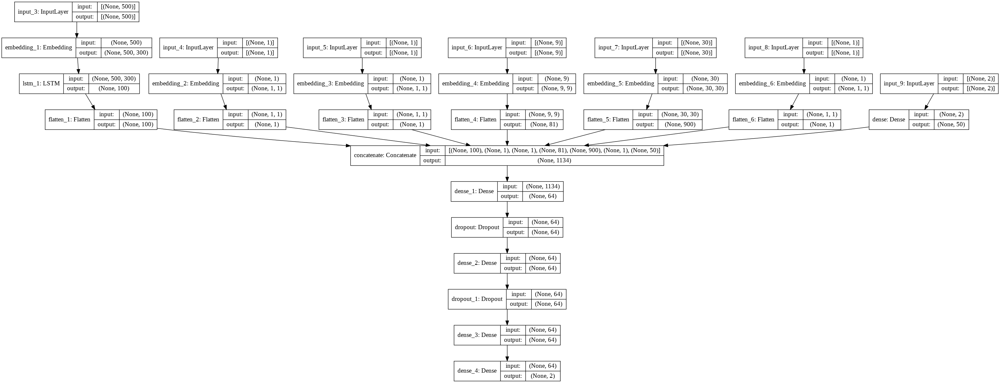

In [ ]:
tf.keras.utils.plot_model(model1, to_file='/content/model1.png', show_shapes=True)

# Inference on Models

In [1]:
from tabulate import tabulate
table = [["MultinomialNB",0.66],["Decision Tree Classifier",0.60],["Gradient Boosting Classifier",0.66],["LSTM + Embedding Layers",0.75]]
headers = [ "Model","AUC score"]
print(tabulate(table, headers, tablefmt="grid"))

+------------------------------+-------------+
| Model                        |   AUC score |
+==============================+=============+
| MultinomialNB                |        0.66 |
+------------------------------+-------------+
| Decision Tree Classifier     |        0.6  |
+------------------------------+-------------+
| Gradient Boosting Classifier |        0.66 |
+------------------------------+-------------+
| LSTM + Embedding Layers      |        0.75 |
+------------------------------+-------------+


# Conclusion:

*   Donors Choose dataset has many features categorical, numerical, text data.
*   From our EDA analysis we know that we have imbalanced dataset.
*   Rejected projects have less number of words in essay column, from EDA analysis
*   TF-IDF Vectorization we have used here along with pretrained Glove-vector word embeddings.
*   ML models such as Naive Bayes, Decision Tree , Ensemble model- GBDT the data is trained on, results convey us that ensemble models perform the best among ML models. Naive bayes is the best for text classification.
*   LSTM with embedding layer for DL model is the state of the art technique for sequential data. And so we have a good AUC score of 0.75.





